In [1]:
import scipy.io
import tensorflow as tf

from tensorflow.keras import datasets, layers, models
import matplotlib.pyplot as plt
from scipy.linalg import norm

from tqdm.keras import TqdmCallback
from tqdm.notebook import tqdm
from tensorflow.keras.callbacks import EarlyStopping

from itertools import product
from random import shuffle

from plot_keras_history import plot_history
import matplotlib.pyplot as plt
# import keras_tuner as kt
from keras.models import load_model

import matplotlib
from os.path import exists

from sklearn.metrics import mean_squared_error
import numpy as np

import seaborn as sns
import pandas as pd

from collections import defaultdict
import pickle,os

from tensorflow.keras.models import load_model

from Pyfhel import Pyfhel, PyPtxt, PyCtxt
import time

HYPARAMETER_TUNING = False
TRAIN_MODEL = False
# GOOGLE_COLAB = True

import pickle
import numpy as np
from tqdm import tqdm
import os

import pickle
import numpy as np
from tqdm import tqdm
import os

np.random.seed(10)

2024-04-21 11:22:35.529045: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-04-21 11:22:35.531998: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-04-21 11:22:35.560566: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-21 11:22:36.220314: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
PROJECT_FOLDER = ''

In [3]:
data = scipy.io.loadmat('data.mat')

trainData = data['trainData'].transpose((3,0,1,2))
trainLabels = data['trainLabels'].transpose((3,0,1,2))
valData = data['valData'].transpose((3,0,1,2))
valLabels = data['valLabels'].transpose((3,0,1,2))

In [4]:
print(trainData.shape)
print(valData.shape)


(480, 612, 14, 1)
(32, 612, 14, 1)


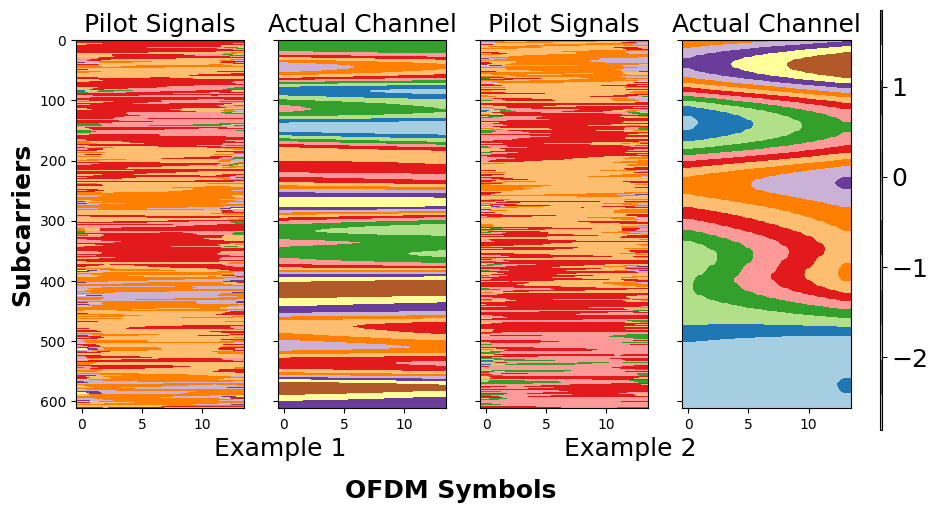

In [5]:
cmap_name = 'Paired'
font_size = 18

rand_idx = np.random.randint(0,valData.shape[0],2)

test_input1 = valData[rand_idx[0]:rand_idx[0]+1,:]
real_output1 = valLabels[rand_idx[0]:rand_idx[0]+1,:]

test_input2 = valData[rand_idx[1]:rand_idx[1]+1,:]
real_output2 = valLabels[rand_idx[1]:rand_idx[1]+1,:]

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(10,6), sharey=True)

im1 = ax[0].imshow(test_input1.reshape(612,14), cmap=cmap_name)
ax[0].set_aspect(0.05)
ax[0].set_title('Pilot Signals',fontsize=font_size)

ax[1].imshow(real_output1.reshape(612,14), cmap=cmap_name)
ax[1].set_aspect(0.05)
ax[1].set_title('Actual Channel',fontsize=font_size)

im1 = ax[2].imshow(test_input2.reshape(612,14), cmap=cmap_name)
ax[2].set_aspect(0.05)
ax[2].set_title('Pilot Signals',fontsize=font_size)

ax[3].imshow(real_output2.reshape(612,14), cmap=cmap_name)
ax[3].set_aspect(0.05)
ax[3].set_title('Actual Channel',fontsize=font_size)

ax[0].set_ylabel('Subcarriers',fontsize=font_size, fontweight='bold')
fig.text(0.5,0.05, "OFDM Symbols", ha="center", va="center", fontsize=font_size, fontweight='bold')
fig.text(0.33,0.12, "Example 1", ha="center", va="center", fontsize=font_size, fontweight='normal')
fig.text(0.68,0.12, "Example 2", ha="center", va="center", fontsize=font_size, fontweight='normal')

cbar_ax = fig.add_axes([0.92, 0.152, 0.02, 0.7])
fig.colorbar(im1,cax=cbar_ax)
cbar_ax.set_aspect(50.5)
cbar_ax.tick_params(labelsize=font_size)

plt.show()

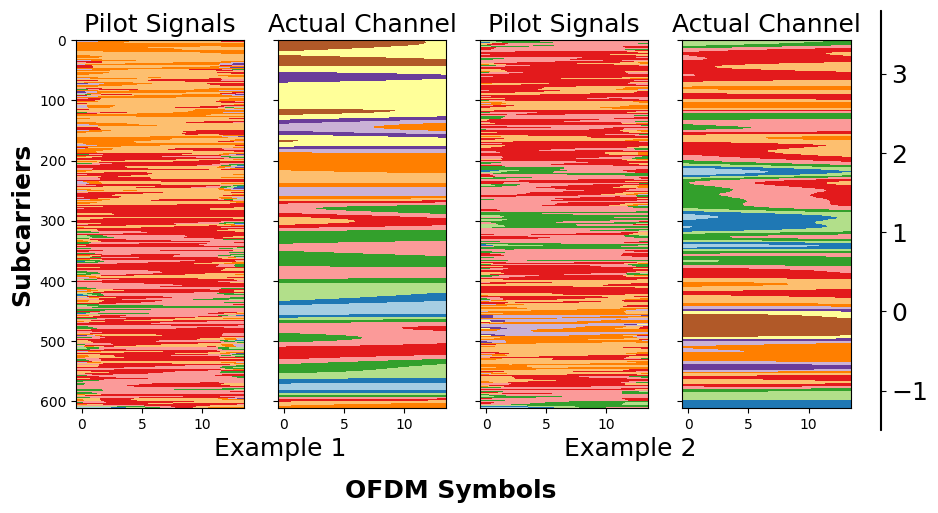

In [6]:
cmap_name = 'Paired'
font_size = 18

rand_idx = np.random.randint(0,valData.shape[0],2)

test_input1 = valData[rand_idx[0]:rand_idx[0]+1,:]
real_output1 = valLabels[rand_idx[0]:rand_idx[0]+1,:]

test_input2 = valData[rand_idx[1]:rand_idx[1]+1,:]
real_output2 = valLabels[rand_idx[1]:rand_idx[1]+1,:]

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(10,6), sharey=True)

im1 = ax[0].imshow(test_input1.reshape(612,14), cmap=cmap_name)
ax[0].set_aspect(0.05)
ax[0].set_title('Pilot Signals',fontsize=font_size)

ax[1].imshow(real_output1.reshape(612,14), cmap=cmap_name)
ax[1].set_aspect(0.05)
ax[1].set_title('Actual Channel',fontsize=font_size)

im1 = ax[2].imshow(test_input2.reshape(612,14), cmap=cmap_name)
ax[2].set_aspect(0.05)
ax[2].set_title('Pilot Signals',fontsize=font_size)

ax[3].imshow(real_output2.reshape(612,14), cmap=cmap_name)
ax[3].set_aspect(0.05)
ax[3].set_title('Actual Channel',fontsize=font_size)

ax[0].set_ylabel('Subcarriers',fontsize=font_size, fontweight='bold')
fig.text(0.5,0.05, "OFDM Symbols", ha="center", va="center", fontsize=font_size, fontweight='bold')
fig.text(0.33,0.12, "Example 1", ha="center", va="center", fontsize=font_size, fontweight='normal')
fig.text(0.68,0.12, "Example 2", ha="center", va="center", fontsize=font_size, fontweight='normal')

cbar_ax = fig.add_axes([0.92, 0.152, 0.02, 0.7])
fig.colorbar(im1,cax=cbar_ax)
cbar_ax.set_aspect(50.5)
cbar_ax.tick_params(labelsize=font_size)

plt.show()

In [7]:
def get_model(mult_factor = 1.0, model_name=''):
	model = models.Sequential(name=model_name)
	# selu, softplus, selu
	model.add(layers.Conv2D(int(16*mult_factor), (9, 9), padding='same', activation='selu', input_shape=(612, 14, 1)))
	model.add(layers.Conv2D(int(16*mult_factor), (5, 5), padding='same', activation='softplus'))
	model.add(layers.Conv2D(1, (5, 5),  padding='same', activation='selu'))

	return model

In [8]:
model = get_model(1.0, model_name = 'FL-model')

es_teacher = EarlyStopping(monitor='val_loss',
						  patience=50,
						  verbose=1,
						  restore_best_weights=True,
						  mode='min')

model.compile(optimizer='adam',
					  loss='mse',
					  metrics=['mse'])
# Train and evaluate teacher on data.

hist_model = model.fit(trainData, trainLabels,
			  epochs=1,
			  verbose=0,batch_size=128,
			  callbacks=[es_teacher,TqdmCallback(verbose=1, desc='DL training')],
			  validation_data=(valData, valLabels))


/home/wubu/miniconda3/envs/heman39/lib/python3.9/site-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(
2024-04-21 11:22:38.873193: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-04-21 11:22:38.873442: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2251] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


DL training: 0epoch [00:00, ?epoch/s]

DL training: 0batch [00:00, ?batch/s]

Restoring model weights from the end of the best epoch: 1.


In [9]:
model = get_model(1.0, model_name = 'FL-model')

es_teacher = EarlyStopping(monitor='val_loss',
						  patience=50,
						  verbose=1,
						  restore_best_weights=True,
						  mode='min')

model.compile(optimizer='adam',
					  loss='mse',
					  metrics=['mse'])
# Train and evaluate teacher on data.

hist_model = model.fit(trainData, trainLabels,
			  epochs=1,
			  verbose=0,batch_size=128,
			  callbacks=[es_teacher,TqdmCallback(verbose=1, desc='DL training')],
			  validation_data=(valData, valLabels))


DL training: 0epoch [00:00, ?epoch/s]

DL training: 0batch [00:00, ?batch/s]

Restoring model weights from the end of the best epoch: 1.


In [10]:
model.summary()

Model: "FL-model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 612, 14, 16)    │         1,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 612, 14, 16)    │         6,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 612, 14, 1)     │           401 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,389 (95.27 KB)

 Trainable params: 8,129 (31.75 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,260 (63.52 KB)

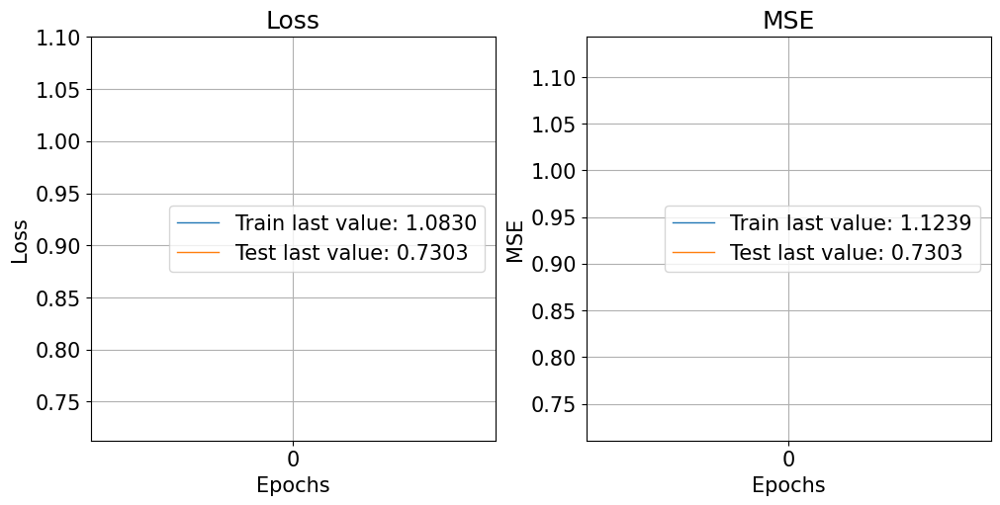

In [11]:

import matplotlib
matplotlib.rcParams.update({'font.size': 15})
plot_history(hist_model.history)
plt.savefig("undefended_training_history.pdf",bbox_inches='tight')
plt.show()

In [12]:
def gen_pk():
	HE = Pyfhel()  # Creating empty Pyfhel object
	ckks_params = {
	"scheme": "CKKS", 
	"n": 2**14,  
	"scale": 2**30,  
	"qi_sizes": [60, 30, 30, 30, 60], 
	}
	HE.contextGen(**ckks_params)
	HE.keyGen()
	keys ={}
	keys['HE'] = HE
	keys['con'] = HE.to_bytes_context()
	keys['pk'] = HE.to_bytes_public_key()
	keys['sk'] = HE.to_bytes_secret_key()

	return keys , HE
keys , HE = gen_pk()

In [13]:
print(keys['sk'])

b'^\xa1\x10\x04\x00\x02\x00\x00\xb2W\x07\x00\x00\x00\x00\x00(\xb5/\xfd\xa0H\x00\n\x00\x00\x00\x10\xc0W\x194\x97\xa8\x9f@\x8c)gb\x17\x13\xeb)\xb2+\x94\x9dY\xfa\xa5j\xe1\x10Sc\x04^\xa7H\x00@\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0?^\xa1\x10\x04\x00\x00\x00\x00\x18\x00\n\x00\x00\x00\x00\x00\x00@\x01\x00\x00\x00\x00\x00\xdd\xcf\xb4\x03\x10\x07\x10\x0fR\xa9C\xfa\x81\xb8u\x02IJ\xb49\xb2k5\n\xfc\x03\xf8z\xb7=\xe7\x07\xee3\x10\xeb\x0b\xd2y\x03\xcc\xbfBc@6\xd2\x03A0O\xd7\xd3\xce\x98\x0605\xeb\x0c\xc80+\x0ex-".\xf7\t2\x08\x18\x93\x96\x9a[\xef\xe3\x07\xad\x85\xce7:\xa8y\x0bU\xd4\x8e\xce\x15i\xb7\rx\xc38\xb1/\xae\xd8\x0f)\x94[\xf0\x07\x01\xc3\t\x1d \x8a8\x98\x9d\xd1\x0e\xbb\xb5\x9d\x89\x80\xdf\xfe\x0f\xb8qr%b\x93\x97\x01\xfbgqN\xef\x9d\x15\x04\xa4W\x03\xa1\xe0y\xda\n\xbf\x88\xcf\x1d\x9a\x0f\x97\n$Wt\xca{:\\\x081\xfa\x83j\xd7\x838\x06u\x9ap,u\xbeV\x03\x18\x0c\xdb\xff"\x8a_\x08\x0b\xdec=dk\x87\tp\xb7\x9d\x912\x80\x84\r`\xa7\x90\xfd\xeao\xa8\n\xd5a\x85\xc1\xc5\x9e\x06\t!\xf9\xc9X\x19F\x0f

In [14]:
def prep_df(num_of_clients,shuffle=True):
	trainData, trainLabels
	splitted_trainData = np.array_split(trainData,num_of_clients)
	splitted_trainLabels = np.array_split(trainLabels,num_of_clients)
	print (len(splitted_trainData))
	for i in range(len(splitted_trainData)):
		np.savez('client-' + str(i) + '.npz',
						 trainData=splitted_trainData[i],
						 trainLabels=splitted_trainLabels[i])

In [15]:
client_ids = [0 , 1, 2]

In [16]:
keys , private = {id : {} for id in client_ids} , {id : {} for id in client_ids}

In [17]:
def init_client(client_id , keys , private):
	HE = Pyfhel()  # Creating empty Pyfhel object
	ckks_params = {
	"scheme": "CKKS", 
	"n": 2**14,  
	"scale": 2**30,  
	"qi_sizes": [60, 30, 30, 30, 60], 
	}
	HE.contextGen(**ckks_params)
	HE.keyGen()
	
	keys[client_id]['HE'] = HE
	keys[client_id]['con'] = HE.to_bytes_context()
	keys[client_id]['pk'] = HE.to_bytes_public_key()
	private[client_id]['sk'] = HE.to_bytes_secret_key()

In [18]:
init_client(0,keys,private)

In [19]:
for client_id in client_ids:
    init_client(client_id,keys,private)

In [20]:
def prep_df(num_of_clients,shuffle=True):
	trainData, trainLabels
	splitted_trainData = np.array_split(trainData,num_of_clients)
	splitted_trainLabels = np.array_split(trainLabels,num_of_clients)
	print (len(splitted_trainData))
	for i in range(len(splitted_trainData)):
		np.savez('client-' + str(i) + '.npz',
						 trainData=splitted_trainData[i],
						 trainLabels=splitted_trainLabels[i])

In [21]:
def encrypt_model(client_id ):
    model_weight = np.load(f"weights{client_id}.npz", allow_pickle=True)["arr_0"]
    encrypted_weights = {} 
    

In [22]:
def encrypt_model(client_id, HE):
	model_weight = np.load(f"weights{client_id}.npz", allow_pickle=True)["arr_0"]
	encrypted_weights = []

	for i, weights in enumerate(tqdm(model_weight, desc="Model Encryption")):
		shape = weights.shape
		weights_flat = weights.flatten().astype(np.float64)
		encrypted_batches = []
		nSlots = 2**13  
		for j in range(0, len(weights_flat), nSlots):
			batch = weights_flat[j:j+nSlots]
			encrypted_batch = HE.encryptFrac(batch)  
			encrypted_batches.append(encrypted_batch)
		encrypted_weights.append({'weights': encrypted_batches[:], 'shape': shape[:]})

	filename = f"weights/client_{client_id}.pickle"
	dic = {"key": HE, "weights": encrypted_weights}

	if not os.path.exists("weights"):
		os.makedirs("weights")

	with open(filename, "wb") as handle:
		pickle.dump((dic,keys , private ),  handle, protocol=pickle.HIGHEST_PROTOCOL)

encrypt_model(0, HE)


Model Encryption:   0%|          | 0/6 [00:00<?, ?it/s]

Model Encryption: 100%|██████████| 6/6 [00:00<00:00, 79.35it/s]


In [23]:
2**13

8192

In [24]:
def decrypt_model(client_id, HE):
    filename = f"weights/client_{client_id}.pickle"
    with open(filename, "rb") as handle:
        data = pickle.load(handle)
        encrypted_weights = data["val"]
        HE = data["key"]
        private_key = data.get("private", None)  # Optional private key

    decrypted_weights = {}

    for cid in encrypted_weights.keys():
        decrypted_batches = []
        for encrypted_batch in encrypted_weights[cid]["weights"]:
            decrypted_batch = HE.decryptFrac(encrypted_batch)
            decrypted_batches.append(decrypted_batch)

        decrypted_weights_flat = np.concatenate(decrypted_batches)
        decrypted_weights[cid] = decrypted_weights_flat.reshape(encrypted_weights[cid]["shape"])

    return decrypted_weights

In [27]:
client_id = 0
filename = f"weights/client_{client_id}.pickle"
with open(filename, "rb") as handle:
    encrypted_weights = pickle.load(handle)
                                    


In [30]:
print(encrypted_weights)

({'key': <ckks Pyfhel obj at 0x7fc81c66f670, [pk:-, sk:-, rtk:-, rlk:-, contx(n=16384, t=0, sec=128, qi=[60, 30, 30, 30, 60], scale=1073741824.0, )]>, 'weights': [{'weights': [<Pyfhel Ciphertext at 0x7fc81c66bea0, scheme=ckks, size=2/2, scale_bits=30, mod_level=0>], 'shape': (9, 9, 1, 48)}, {'weights': [<Pyfhel Ciphertext at 0x7fc81c66f9a0, scheme=ckks, size=2/2, scale_bits=30, mod_level=0>], 'shape': (48,)}, {'weights': [<Pyfhel Ciphertext at 0x7fc81c66f0e0, scheme=ckks, size=2/2, scale_bits=30, mod_level=0>, <Pyfhel Ciphertext at 0x7fc81c66f450, scheme=ckks, size=2/2, scale_bits=30, mod_level=0>, <Pyfhel Ciphertext at 0x7fc81c66f590, scheme=ckks, size=2/2, scale_bits=30, mod_level=0>], 'shape': (5, 5, 48, 16)}, {'weights': [<Pyfhel Ciphertext at 0x7fc81c66f720, scheme=ckks, size=2/2, scale_bits=30, mod_level=0>], 'shape': (16,)}, {'weights': [<Pyfhel Ciphertext at 0x7fc81c66fc70, scheme=ckks, size=2/2, scale_bits=30, mod_level=0>], 'shape': (5, 5, 16, 1)}, {'weights': [<Pyfhel Cipher

In [31]:
with open("output.txt", "w") as file:
    print(encrypted_weights, file=file)

# Print the output to the console (optional)
# print(encrypted_weights)

In [35]:
len(encrypted_weights[0]["weights"])

6

In [36]:
encrypted_weights[0]["weights"]

[{'weights': [<Pyfhel Ciphertext at 0x7fc81c66bea0, scheme=ckks, size=2/2, scale_bits=30, mod_level=0>],
  'shape': (9, 9, 1, 48)},
 {'weights': [<Pyfhel Ciphertext at 0x7fc81c66f9a0, scheme=ckks, size=2/2, scale_bits=30, mod_level=0>],
  'shape': (48,)},
 {'weights': [<Pyfhel Ciphertext at 0x7fc81c66f0e0, scheme=ckks, size=2/2, scale_bits=30, mod_level=0>,
   <Pyfhel Ciphertext at 0x7fc81c66f450, scheme=ckks, size=2/2, scale_bits=30, mod_level=0>,
   <Pyfhel Ciphertext at 0x7fc81c66f590, scheme=ckks, size=2/2, scale_bits=30, mod_level=0>],
  'shape': (5, 5, 48, 16)},
 {'weights': [<Pyfhel Ciphertext at 0x7fc81c66f720, scheme=ckks, size=2/2, scale_bits=30, mod_level=0>],
  'shape': (16,)},
 {'weights': [<Pyfhel Ciphertext at 0x7fc81c66fc70, scheme=ckks, size=2/2, scale_bits=30, mod_level=0>],
  'shape': (5, 5, 16, 1)},
 {'weights': [<Pyfhel Ciphertext at 0x7fc81c66f2c0, scheme=ckks, size=2/2, scale_bits=30, mod_level=0>],
  'shape': (1,)}]